## Сравнение качества модели EPiC-Transformer с разным количеством мод в смеси гауссовских шумов (обучаемая и необучаемая смесь) по метрике $W_1$ для частицы с максимальным абсолютным значением импульса

GPU: T4

In [1]:
%pip install -q uproot
%pip install -q awkward-pandas


[notice] A new release of pip is available: 23.0.1 -> 26.1
[notice] To update, run: python3 -m pip install --upgrade pip

[notice] A new release of pip is available: 23.0.1 -> 26.1
[notice] To update, run: python3 -m pip install --upgrade pip


In [2]:
%pip install gdown==4.6.1

Defaulting to user installation because normal site-packages is not writeable

[notice] A new release of pip is available: 23.0.1 -> 26.1
[notice] To update, run: python3 -m pip install --upgrade pip


In [3]:
import torch
from torch import optim, nn
from torch.utils.data import TensorDataset, DataLoader
import os
import gdown
import warnings
import uproot
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import torch
import numpy as np
from IPython.display import clear_output
from scipy import stats
from scipy.stats import wasserstein_distance
import random
from scipy.interpolate import interp1d
from scipy.integrate import simpson
from torch.nn.utils import weight_norm, clip_grad_norm_
import copy
import torch.nn.functional as F
import warnings

In [4]:
warnings.filterwarnings("ignore")

In [5]:
N = 2112  # neutron PDG
P = 2212  # proton PDG
pion_masses = {211: 0.13957039, -211: 0.13957039, 111: 0.1349768}  # pions masses
pions = list(pion_masses)  # pions PDG
directions = ["x", "y", "z"]  # momenta components
nucleons = [N, P]
particles = nucleons + pions
label_to_num = {col: i for i, col in enumerate(pions)}  # ordinal encoding for pions PDG
num_to_label = {v: k for k, v in label_to_num.items()}  # ordinal decoding for pions PDG
feat_dim = 3  # generated data dimensionality
seeds = [0xF00D]  # random seeds for experiments (use only one)

In [6]:
def set_seed(seed):
    """
    Function forrandom seed fixation.
    Paramerers:
    - seed
    """
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)


def calc_vn_vs_pt(data, pt_min, pt_max, eta_max, nbins, n, n_interp=500):
    """
    Function for calculating v_n(p_T) dependency with error bars.

    Parameters:
    - data - particles momenta;
    - pt_min - minimal value of transverse momentum;
    - pt_max - maximum value of transverse momentum;
    - eta_max - maximum value of pseudorapidity;
    - nbins - number of bins for v_n(p_T) dependency;
    - n - cosine coefficient (flow number);
    - n_interp - number of points for interpolation.

    Return:
    - p_interp - interpolated p_T values;
    - vn_interp - interpolated v_n values;
    - err_interp - interpolated errors (standard error of the mean).
    """
    pt_all, phi_all = [], []
    for event in data:
        if isinstance(event, torch.Tensor):
            event = event.cpu().numpy()
        px = event[..., 0]
        py = event[..., 1]
        pz = event[..., 2]
        pt = np.sqrt(px**2 + py**2)
        p_total = np.sqrt(pt**2 + pz**2)
        eta = 0.5 * np.log((p_total + pz) / (p_total - pz + 1e-10))
        mask = (pt > pt_min) & (pt < pt_max) & (np.abs(eta) < eta_max)
        pt_all.extend(pt[mask])
        phi_all.extend(np.arctan2(py[mask], px[mask]))
    pt_all = np.array(pt_all)
    phi_all = np.array(phi_all)
    bin_edges = np.linspace(pt_min, pt_max, nbins + 1)
    bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2
    vn_vals = []
    err_vals = []
    for i in range(nbins):
        mask_bin = (pt_all >= bin_edges[i]) & (pt_all < bin_edges[i + 1])
        if np.sum(mask_bin) == 0:
            vn_vals.append(np.nan)
            err_vals.append(np.nan)
        else:
            cos_nphi = np.cos(n * phi_all[mask_bin])
            vn_vals.append(np.mean(cos_nphi))
            err_vals.append(np.std(cos_nphi) / np.sqrt(len(cos_nphi)))
    vn_vals = np.array(vn_vals)
    err_vals = np.array(err_vals)
    valid = ~np.isnan(vn_vals)
    if np.sum(valid) < 2:
        p_interp = np.linspace(pt_min, pt_max, n_interp)
        vn_interp = np.array([0.0 for _ in range(len(p_interp))])
        err_interp = np.array([0.0 for _ in range(len(p_interp))])
        return p_interp, vn_interp, err_interp
    bin_centers_valid = bin_centers[valid]
    vn_valid = vn_vals[valid]
    err_valid = err_vals[valid]
    f_vn = interp1d(
        bin_centers_valid,
        vn_valid,
        kind="linear",
        fill_value="extrapolate",
        bounds_error=False,
    )
    f_err = interp1d(
        bin_centers_valid,
        err_valid,
        kind="linear",
        fill_value="extrapolate",
        bounds_error=False,
    )
    p_interp = np.linspace(pt_min, pt_max, n_interp)
    vn_interp = f_vn(p_interp)
    err_interp = f_err(p_interp)
    return p_interp, vn_interp, err_interp


def get_masked_pt(p, pt_min=0.2, pt_max=None, eta_max=1.0):
    """
    Function for calculating transverse momenta with mask.
    Parameters:
    - p - particles momenta;
    - pt_min - minimal value of transverse momentum;
    - pt_max - maximum value of transverse momentum;
    - eta_max - maximum value of pseudorapidity.
    Return:
    - mask - mask depending on pt_min, pt_max amd eta_max;
    - pt - transverse momenta tensor.
    """
    px, py, pz = p[..., 0], p[..., 1], p[..., 2]
    pt = torch.sqrt(px**2 + py**2)
    p_total = torch.sqrt(pt**2 + pz**2)
    eta = 0.5 * torch.log((p_total + pz) / (p_total - pz + 1e-10))
    mask = (pt > pt_min) & (torch.abs(eta) < eta_max)
    if pt_max is not None:
        mask = mask & (pt < pt_max)
    return mask, pt


def calc_pt_dist(data, pt_min=0.0, pt_max=2.0, eta_max=10.0):
    """
    Function for calculating transverse momenta distribution.
    Parameters:
    - data - particles momenta;
    - pt_min - minimal value of transverse momentum;
    - pt_max - maximum value of transverse momentum;
    - eta_max - maximum value of pseudorapidity.
    Return:
    - tensor of selected transverse momenta
    """
    pt_list = []
    for event in data:
        mask, pt_event = get_masked_pt(event, pt_min, pt_max, eta_max)
        pt_sel = pt_event[mask]
        pt_list.append(pt_sel)
    return (
        torch.cat(pt_list)
        if pt_list
        else torch.tensor(
            [], device=data.device if isinstance(data, torch.Tensor) else data[0].device
        )
    )


def kl_divergence(real_kde, fake_kde, x, eps=1e-12):
    """
    Function for calculating KL divergence.
    Parameters:
    - real_kde - KDE of real data;
    - fake_kde - KDE of generated data;
    - x - points;
    - eps - for numeric stability.
    Return:
    - KL divergence value
    """
    p = real_kde.evaluate(x)
    q = fake_kde.evaluate(x)
    return simpson(p * np.log((p + eps) / (q + eps)), x)


def w2_distance_1d(real, fake):
    """
    Function for calculating W2 distance.
    Parameters:
    - real_values - real data;
    - fake_values - generated data.
    Return:
    - W2 distance depending on data lengths
    """
    real_sorted = np.sort(real)
    fake_sorted = np.sort(fake)
    if len(real_sorted) != len(fake_sorted):
        q = np.linspace(0, 1, min(len(real_sorted), len(fake_sorted)))
        real_quant = np.quantile(real_sorted, q)
        fake_quant = np.quantile(fake_sorted, q)
        return np.sqrt(np.mean((real_quant - fake_quant) ** 2))
    else:
        return np.sqrt(np.mean((real_sorted - fake_sorted) ** 2))


def calc_energy(px, py, pz, masses):
    """
    Fucntion for calculating energies of particles (using momenta and masses).
    Parameters:
    - px - x momenta component;
    - py - y momenta component;
    - pz - z moment component;
    - masses - tensor of particles masses.
    Return:
    - tensor of particles energies
    """
    return torch.sqrt(px**2 + py**2 + pz**2 + masses**2)


def calc_m_inv(row, mass_number=131):
    """
    Function for calculating invariant mass per nucleon.
    Parameters:
    - row - row of ROOT data DataFrame;
    - mass_number - mass number of colliding nuclei.
    Return:
    - invariant mass per nucleon
    """
    energy = np.sum(row["fParticles.fE"])
    px = np.sum(row["fParticles.fPx"])
    py = np.sum(row["fParticles.fPy"])
    pz = np.sum(row["fParticles.fPz"])
    M_inv = np.sqrt(np.maximum(0, energy**2 - (px**2 + py**2 + pz**2)))
    return M_inv / mass_number


def select_particles(row, target_col, mask_cols):
    """
    Function for selecting particles using mask.
    Parameters:
    - row - row of ROOT data DataFrame;
    - target_col - column of selecting data;
    - mask_cols - columns for mask.
    Return:
    - selected values
    """
    feature_arr = np.array(row[target_col])
    mask_arr = np.zeros_like(feature_arr)
    for col in mask_cols:
        mask_arr += row[col]
    return feature_arr[mask_arr.astype(bool)]


def calc_pseudorapidity(px=None, py=None, pz=None, eps=1e-5):
    """
    Fucntion for calculating pseudorapidity.
    Parameters:
    - px - momenta x component;
    - py - momenta y component;
    - pz - momenta z component;
    - eps - for numeric stability.
    Return:
    - pseudorapidity array
    """
    norm = np.sqrt(px**2 + py**2 + pz**2)
    return 0.5 * np.log(eps + (norm + pz) / (eps + norm - pz))


def calc_pT(px, py):
    """
    Fucntion for calculating transverse momenta.
    Parameters:
    - px - momenta x component;
    - py - momenta y component.
    Return:
    - transverse momenta array
    """
    return np.sqrt(px**2 + py**2)


def calc_flows(px, py, weights=None):
    """
    Function for calculating v1, v2, v3 flows.
    Parameters:
    - px - momenta x component;
    - py - momenta y component;
    - weights - for vn correction.
    Return:
    - v1 flow;
    - v2 flow;
    -v3 flow
    """
    phi = np.arctan2(py, px)
    n = len(phi)
    w = np.ones(n) if weights is None else weights
    sum_w = np.sum(w)
    v1 = np.sum(w * np.cos(phi)) / sum_w
    v2 = np.sum(w * np.cos(2 * phi)) / sum_w
    v3 = np.sum(w * np.cos(3 * phi)) / sum_w
    return v1, v2, v3


def get_nucleons_by_type(px, py, pz, part_type="spectators", threshold=2.0):
    """
    Function for creating spectators or participants mask (using pseudorapidity).
    Parameters:
    - px - momenta x component;
    - py - momenta y component;
    - pz - momenta z component;
    - part_type - spectators or participants;
    - threshold - for separating spectators and participants.
    Return:
    - nucleons mask
    """
    eta = calc_pseudorapidity(px, py, pz)
    if part_type == "spectators":
        return eta > threshold
    else:
        return eta <= threshold


def get_part_spec(row, target_col, part_type="spectators"):
    """
    Function for selecting nucleons features depending on type.
    Parameters:
    - row - row of ROOT data DataFrame;
    - target_col - target particles features;
    - part_type - spectators or participants.
    Return:
    - selected features
    """
    nucleon_mask = np.array(row[N]) | np.array(row[P])
    nucleon_indices = np.where(nucleon_mask)[0]
    px = np.array(row["fParticles.fPx"])[nucleon_indices]
    py = np.array(row["fParticles.fPy"])[nucleon_indices]
    pz = np.array(row["fParticles.fPz"])[nucleon_indices]
    type_mask = get_nucleons_by_type(px, py, pz, part_type)
    selected_indices = nucleon_indices[type_mask]
    return np.array(row[target_col])[selected_indices]


def get_final_moms(mom_x, mom_y, mom_z, energy, max_size):
    """
    Function for preprocessing particles momenta.
    Parameters:
    - mom_x - momenta x component;
    - mom_y - momenta y component;
    - mom_z - momenta z component;
    - energy - partclies energies;
    - max_size - maximum length of particles sequences.
    Return:
    - mom_merged - padded momenergy;
    - mask - padding mask
    """
    if mom_x.shape[0] >= max_size:
        mask = np.ones(max_size, dtype=float)
        mom_x = mom_x[:max_size]
        mom_y = mom_y[:max_size]
        mom_z = mom_z[:max_size]
        energy = energy[:max_size]
        mom_merged = np.vstack((mom_x, mom_y, mom_z, energy)).T
    else:
        mask = np.zeros(max_size)
        mask[: len(mom_x)] = 1.0
        zeros_x = np.zeros(max_size)
        zeros_x[: len(mom_x)] = mom_x
        zeros_y = np.zeros(max_size)
        zeros_y[: len(mom_y)] = mom_y
        zeros_z = np.zeros(max_size)
        zeros_z[: len(mom_z)] = mom_z
        zeros_e = np.zeros(max_size)
        zeros_e[: len(energy)] = energy
        mom_merged = np.vstack((zeros_x, zeros_y, zeros_z, zeros_e)).T
    return mom_merged, mask


def preprocess_urqmd(urqmd, max_size_t=80, max_size_c=250, return_cols=False):
    """
    Function for preprocessing ROOT dataset.
    Parameters:
    - urqmd - ROOT dataset;
    - max_size_t - maximum length of target "other" particles sequences;
    - max_size_c - maximum length of nucleons sequences;
    - return cols - flag if condition columns names is needed.
    Return:
    - df - preprocessed DataFrame;
    - cond_cols - external colition columns names;
    - nucleons_cols - nucleons padded features columns names;
    - nucleons_mask_cols - nucleons padding mask columns names
    """
    urqmd_new = pd.DataFrame()
    if "fB" in urqmd.columns:
        urqmd_new["B"] = urqmd["fB"]
    urqmd_new["m_inv"] = urqmd.apply(calc_m_inv, axis=1)
    for p in particles:
        urqmd[p] = urqmd["fParticles.fPdg"].apply(lambda x: np.array(x) == p)
    for d in directions:
        urqmd_new[f"mom_{d}"] = urqmd.apply(
            lambda x: select_particles(x, f"fParticles.fP{d}", nucleons), axis=1
        )
        urqmd_new[f"coord_{d}"] = urqmd.apply(
            lambda x: select_particles(x, f"fParticles.f{d.upper()}", nucleons), axis=1
        )
        urqmd_new[f"mom_part_{d}"] = urqmd.apply(
            lambda x: get_part_spec(x, f"fParticles.fP{d}", "participants"), axis=1
        )
        urqmd_new[f"coord_part_{d}"] = urqmd.apply(
            lambda x: get_part_spec(x, f"fParticles.f{d.upper()}", "participants"),
            axis=1,
        )
    urqmd_new["energy_part"] = urqmd.apply(
        lambda x: get_part_spec(x, "fParticles.fE", "participants"), axis=1
    )
    urqmd_new["energy"] = urqmd.apply(
        lambda x: select_particles(x, "fParticles.fE", nucleons), axis=1
    )
    urqmd_new["mom_norm"] = urqmd_new.apply(
        lambda x: np.sqrt(x["mom_x"] ** 2 + x["mom_y"] ** 2 + x["mom_z"] ** 2), axis=1
    )
    urqmd_new["pseudorapidity"] = urqmd_new.apply(
        lambda x: calc_pseudorapidity(px=x["mom_x"], py=x["mom_y"], pz=x["mom_z"]),
        axis=1,
    )
    urqmd_new["pseudorapidity_part"] = urqmd_new.apply(
        lambda x: calc_pseudorapidity(
            px=x["mom_part_x"], py=x["mom_part_y"], pz=x["mom_part_z"]
        ),
        axis=1,
    )
    urqmd_new["mom_T_part"] = urqmd_new.apply(
        lambda x: calc_pT(x["mom_part_x"], x["mom_part_y"]), axis=1
    )
    flows = urqmd_new.apply(
        lambda x: calc_flows(x["mom_part_x"], x["mom_part_y"]),
        axis=1,
        result_type="expand",
    )
    urqmd_new["v1"] = flows[0]
    urqmd_new["v2"] = flows[1]
    urqmd_new["v3"] = flows[2]
    urqmd_new["sum_mom"] = np.sqrt(
        urqmd_new["mom_x"].apply(np.sum) ** 2 + urqmd_new["mom_y"].apply(np.sum) ** 2
    )
    urqmd_new["rms_mom_T"] = np.sqrt(
        urqmd_new["mom_x"].apply(lambda arr: np.mean(arr**2))
        + urqmd_new["mom_y"].apply(lambda arr: np.mean(arr**2))
    )
    urqmd_new["n_p_ratio"] = urqmd.apply(lambda x: np.sum(x[N]) / np.sum(x[P]), axis=1)
    list_cols = [
        "mom_x",
        "mom_y",
        "mom_z",
        "mom_part_x",
        "mom_part_y",
        "mom_part_z",
        "mom_T_part",
        "coord_x",
        "coord_y",
        "coord_z",
        "coord_part_x",
        "coord_part_y",
        "coord_part_z",
        "energy_part",
        "mom_norm",
        "pseudorapidity_part",
        "pseudorapidity",
    ]
    percentiles = [0.5]
    for col in list_cols:
        urqmd_new[f"{col}_mean"] = urqmd_new[col].apply(np.mean)
        urqmd_new[f"{col}_var"] = urqmd_new[col].apply(np.var)
        urqmd_new[f"{col}_kurtosis"] = urqmd_new[col].apply(stats.kurtosis)
        urqmd_new[f"{col}_skew"] = urqmd_new[col].apply(stats.skew)
        for p in percentiles:
            urqmd_new[f"{col}_{p}_perc"] = urqmd_new[col].apply(
                lambda x: np.percentile(x, p)
            )
    for col in ["psi1", "psi2", "mom_T", "phi"]:
        if col in urqmd_new.columns:
            urqmd_new.drop(columns=col, inplace=True)
    cond_cols = ["B", "v1", "v2", "v3"]
    urqmd[cond_cols] = urqmd_new[cond_cols]
    for p in particles:
        for d in directions:
            urqmd[f"{p}_mom_{d}"] = urqmd.apply(
                lambda x: select_particles(x, f"fParticles.fP{d}", [p]), axis=1
            )
        urqmd[f"{p}_energy"] = urqmd.apply(
            lambda x: select_particles(x, "fParticles.fE", [p]), axis=1
        )
    nucleons_cols = [f"{c}_moms" for c in nucleons if c != "nuclei"]
    nucleons_mask_cols = [f"{c}_mask" for c in nucleons if c != "nuclei"]
    df_rows = []
    for i, row in urqmd.iterrows():
        base_cond = {k: row[k] for k in cond_cols}
        for pion in pions:
            cond = base_cond.copy()
            cond["label"] = label_to_num[pion]
            cond["event"] = i
            mom_x = row[f"{pion}_mom_x"]
            mom_y = row[f"{pion}_mom_y"]
            mom_z = row[f"{pion}_mom_z"]
            energy = row[f"{pion}_energy"]
            for bc in nucleons:
                if bc == "nuclei":
                    continue
                baryon_mom_merged, baryon_mask = get_final_moms(
                    mom_x, mom_y, mom_z, energy, max_size_c
                )
                cond[f"{bc}_moms"] = baryon_mom_merged
                cond[f"{bc}_mask"] = baryon_mask
            target_mom_merged, target_mask = get_final_moms(
                mom_x, mom_y, mom_z, energy, max_size_t
            )
            if target_mask.sum() == 0:
                continue
            cond["target_moms"] = target_mom_merged
            cond["target_mask"] = target_mask
            df_rows.append(cond)
    df = pd.DataFrame(df_rows)
    if return_cols:
        return df, cond_cols, nucleons_cols, nucleons_mask_cols
    return df

In [7]:
def plot_losses(losses):
    """
    Function for losses plotting.
    Parameters:
    - losses - dictionary "losses type - epoch losses list"
    """
    clear_output()
    len_ = len(losses.keys())
    fig, ax = plt.subplots(nrows=1, ncols=len_, figsize=(3 * len_, 3))
    for j, k in enumerate(losses.keys()):
        ax[j].plot([i + 1 for i in range(len(losses[k]))], losses[k])
        ax[j].set_title(k)
    plt.tight_layout()
    plt.show()


def plot_kde(real, fake, dim_names, part_type, num=None):
    """
    Fucntion for plotting and calculating distribution metric with respect of .
    Parameters:
    - real - real data;
    - fake - generated data;
    - dim_names - list of momenta components names (x, y, z);
    - part_type - particle type PDG;
    - num - number of selected particle in sequences sorted by momenta absolute value (if None, all particles in sequences are considered).
    Return:
    - kl - KL divergence calculated using KDE of real and fake data;
    - w1 - W1 distance calculated using KDE of real and fake data;
    - w2 - W2 distance calculated using KDE of real and fake data.
    """
    fig, axes = plt.subplots(2, 5, figsize=(25, 7))
    if num is not None:
        p_sq = real[..., 0] ** 2 + real[..., 1] ** 2 + real[..., 2] ** 2
        sorted_indices = torch.argsort(p_sq, dim=1, descending=True)
        kth_idx = sorted_indices[:, num]
        batch_idx = np.arange(real.shape[0])
        real = real[batch_idx, kth_idx]
        p_sq = fake[..., 0] ** 2 + fake[..., 1] ** 2 + fake[..., 2] ** 2
        sorted_indices = torch.argsort(p_sq, dim=1, descending=True)
        kth_idx = sorted_indices[:, num]
        batch_idx = np.arange(fake.shape[0])
        fake = fake[batch_idx, kth_idx]
    else:
        real = real.reshape(-1, real.shape[-1])
        fake = fake.reshape(-1, fake.shape[-1])
    real = real[~torch.all(real == 0.0, dim=1)]
    fake = fake[~torch.all(fake == 0.0, dim=1)]
    masses = torch.full_like(fake[..., -1], pion_masses[part_type])
    real_energy = real[..., -1]
    fake_energy = calc_energy(fake[..., 0], fake[..., 1], fake[..., 2], masses)
    real_eta = calc_pseudorapidity(real[..., 0], real[..., 1], real[..., 2])
    fake_eta = calc_pseudorapidity(fake[..., 0], fake[..., 1], fake[..., 2])
    for i in range(5):
        if i < 3:
            real_vals = real[:, i].numpy()
            fake_vals = fake[:, i].numpy()
            title_pre = f"{part_type} {dim_names[i]}"
        elif i == 3:
            real_vals = real_energy.numpy()
            fake_vals = fake_energy.numpy()
            title_pre = f"{part_type} energy"
        else:
            real_vals = real_eta.numpy()
            fake_vals = fake_eta.numpy()
            title_pre = f"{part_type} pseudorapidity"
        kde_real = stats.gaussian_kde(real_vals, bw_method="scott")
        kde_fake = stats.gaussian_kde(fake_vals, bw_method="scott")
        x_points = np.linspace(
            min(real_vals.min(), fake_vals.min()),
            max(real_vals.max(), fake_vals.max()),
            1000,
        )
        pdf_real = kde_real(x_points)
        pdf_fake = kde_fake(x_points)
        kl = kl_divergence(kde_real, kde_fake, x_points)
        w1 = wasserstein_distance(real_vals, fake_vals)
        w2 = w2_distance_1d(real_vals, fake_vals)
        axes[0, i].plot(x_points, pdf_real, label="Real")
        axes[0, i].plot(x_points, pdf_fake, label="Fake")
        axes[0, i].set_title(
            f'{title_pre} ({"all" if num is None else num}) KL={kl:.3f} W1={w1:.3f} W2={w2:.3f}'
        )
        axes[0, i].legend()
        axes[0, i].grid(True, alpha=0.3)
        axes[1, i].hist(real_vals, bins=50, alpha=0.5, label="Real")
        axes[1, i].hist(fake_vals, bins=50, alpha=0.5, label="Fake")
        axes[1, i].set_title(f"{title_pre} histogram")
        axes[1, i].legend()
        axes[1, i].grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()
    return kl, w1, w2


def plot_scatter(real, fake):
    """
    Function for plotting particles in 3D momenta components space.
    Parameters:
    - real - real data;
    - fake - fake data.
    """
    fig = plt.figure(figsize=(12, 5))
    ax1 = fig.add_subplot(121, projection="3d")
    real_flat = real.reshape(-1, real.shape[-1])
    fake_flat = fake.reshape(-1, fake.shape[-1])
    real_flat = real_flat[~torch.all(real_flat == 0.0, dim=1)]
    fake_flat = fake_flat[~torch.all(fake_flat == 0.0, dim=1)]
    ax1.scatter(
        real_flat[:, 0], real_flat[:, 1], real_flat[:, 2], alpha=0.6, label="Real"
    )
    ax1.set_xlim(-2, 2)
    ax1.set_ylim(-2, 2)
    ax1.set_zlim(-2, 2)
    ax1.set_title("Real")
    ax2 = fig.add_subplot(122, projection="3d")
    ax2.scatter(
        fake_flat[:, 0],
        fake_flat[:, 1],
        fake_flat[:, 2],
        alpha=0.6,
        color="orange",
        label="Fake",
    )
    ax2.set_xlim(-2, 2)
    ax2.set_ylim(-2, 2)
    ax2.set_zlim(-2, 2)
    ax2.set_title("Fake")
    plt.show()


def plot_vn(
    real_data,
    fake_data,
    pt_min=0.0,
    pt_max=2.0,
    eta_max=10.0,
    nbins=10,
    pt_bins=50,
):
    """
    Function for plotting v_n(p_T) dependency and p_T distribution.
    Parameters:
    - real_data - real momenta;
    - fake_data - fake momenta;
    - n - cosine coefficient (flow number);
    - pt_min - minimal value of transverse momentum;
    - pt_max - maximum value of transverse momentum;
    - eta_max - maximum value of pseudorapidity;
    - nbins - number of points for v_n(p_T) dependency;
    - pt_bins - number of bins for p_T distribution histogram
    """
    pt_real_all = calc_pt_dist(real_data, pt_min=0, eta_max=eta_max)
    pt_fake_all = calc_pt_dist(fake_data, pt_min=0, eta_max=eta_max)
    fig, ax = plt.subplots(ncols=2, nrows=2, figsize=(16, 10))
    for n in range(3):
        row = int(n == 2)
        col = n % 2
        real_p_interp, real_vn_interp, real_err = calc_vn_vs_pt(
            real_data, pt_min, pt_max, eta_max, nbins, n + 1
        )
        fake_p_interp, fake_vn_interp, fake_err = calc_vn_vs_pt(
            fake_data, pt_min, pt_max, eta_max, nbins, n + 1
        )
        ax[row][col].plot(real_p_interp, real_vn_interp, label="Real")
        ax[row][col].plot(fake_p_interp, fake_vn_interp, label="Fake")
        ax[row][col].fill_between(
            real_p_interp,
            real_vn_interp - real_err,
            real_vn_interp + real_err,
            alpha=0.3,
        )
        ax[row][col].fill_between(
            fake_p_interp,
            fake_vn_interp - fake_err,
            fake_vn_interp + fake_err,
            alpha=0.3,
        )
        ax[row][col].set_xlabel("pT (GeV/c)")
        ax[row][col].set_ylabel(f"v{n + 1}")
        ax[row][col].legend()
        ax[row][col].grid(alpha=0.3)
        ax[row][col].set_title(f"v{n + 1}(pT) with eta < {eta_max}")
    ax[1][1].hist(
        pt_real_all.numpy(), bins=pt_bins, density=True, alpha=0.5, label="Real"
    )
    ax[1][1].hist(
        pt_fake_all.numpy(), bins=pt_bins, density=True, alpha=0.5, label="Fake"
    )
    ax[1][1].set_xlabel("pT, GeV/c")
    ax[1][1].set_ylabel("Normalized count")
    ax[1][1].set_title("pT distribution")
    ax[1][1].legend()
    ax[1][1].grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()


def plot_pt(real, fake, mode="pt"):
    """
    Function for plotting energy metrics (pT and energy fractions).
    Parameters:
    - real - real momenta;
    - fake - fake momenta;
    - mode - "pt" (transverse momenta) or "energy"
    """
    real_keys = [str(k) for k in real.keys()]
    real_values = [np.mean(v) for v in real.values()]
    fig, ax = plt.subplots(figsize=(8, 5))
    ax.bar(real_keys, real_values, label="Real", alpha=0.5)
    fake_keys = [str(k) for k in fake.keys()]
    fake_values = [np.mean(v) for v in fake.values()]
    bars = ax.bar(fake_keys, fake_values, label="Fake", alpha=0.5)
    real_values = np.array(real_values)
    fake_values = np.array(fake_values)
    ratios = [
        f"{round(val, 2)}%"
        for val in (np.abs(real_values - fake_values) / real_values * 100)
    ]
    ax.bar_label(bars, labels=ratios, padding=3)
    ax.set_xlabel("particle type")
    ax.set_ylabel("value")
    ax.set_title(
        "Transverse momentum modulus fraction" if mode == "pt" else "Energy fraction"
    )
    ax.grid(axis="y", linestyle="--", alpha=0.7)
    ax.legend()
    plt.show()

In [8]:
def generate_transformer(G, batch_size, n_points, cond, labels, device, threshold=0.5):
    """
    Function for particles sets generation via EPiC-styled transformer.
    Parameters:
    - G - tramsformer generator;
    - batch_size, n_points - unused parameters;
    - cond - external condition;
    - labels - particles types;
    - device - "cuda" or "cpu";
    - threshold - threshold for generated mask.
    Return:
    - momenta tensor
    """
    G.eval()
    cond = cond.to(device)
    labels = labels.to(device)
    with torch.no_grad():
        impulses, mask_probs = G(labels, cond)
    mask = (mask_probs >= threshold).float()
    impulses = impulses * mask.unsqueeze(-1)
    return impulses.cpu()


def generate_epic(G, batch_size, n_points, cond, labels, device, zg_dim, zl_dim):
    """
    Function for particles sets generation via vanilla EPiC-GAN.
    Parameters:
    - G - tramsformer generator;
    - batch_size,
    - n_points - length of padded particles sequences;
    - cond - external condition;
    - labels - particles types;
    - device - "cuda" or "cpu";
    - zg_dim - global noise dimensionality;
    - zl_dim - local noise dimensionality.
    Return:
    - momenta tensor
    """
    G.eval()
    cond = cond.to(device)
    labels = labels.to(device)
    z_global = torch.randn(batch_size, zg_dim, device=device)
    z_local = torch.randn(batch_size, n_points, zl_dim, device=device)
    with torch.no_grad():
        impulses = G(z_global, z_local, cond, labels)
    return impulses.cpu()


def count_pt(particles):
    """
    Function for calculating transverse momentum modulus fraction by particle type.
    Paeameters:
    - particles - dictionary containing raw tensors of particles momenta.
    Return:
    - pt_parts - dictionary containing transverse momentum modulus fraction
    """
    pt_parts = {}
    sum_pt = 0
    for k, v in particles.items():
        pt = torch.sum(torch.sqrt(v[:, 0] ** 2 + v[:, 1] ** 2))
        sum_pt += pt
        pt_parts[k] = pt
    pt_parts = {k: (v / sum_pt).item() for k, v in pt_parts.items()}
    return pt_parts


def count_e(particles):
    """
    Function for calculating energy fraction by particle type (using real tabular data).
    Paeameters:
    - particles - dictionary containing raw tensors of particles energies.
    Return:
    - e_parts - dictionary containing energy fraction
    """
    e_parts = {}
    sum_e = 0
    for k, v in particles.items():
        e = torch.sum(v[:, -1])
        sum_e += e
        e_parts[k] = e
    e_parts = {k: (v / sum_e).item() for k, v in e_parts.items()}
    return e_parts


def count_e_with_mass(particles):
    """
    Function for calculating energy fraction by particle type (using momenta and particles masses).
    Paeameters:
    - particles - dictionary containing raw tensors of particles momenta.
    Return:
    - e_parts - dictionary containing energy fraction
    """
    e_parts = {}
    sum_e = 0
    for k, v in particles.items():
        if k == "protons" or k == "neutrons":
            e = torch.sum(v[:, -1])
            sum_e += e
            e_parts[k] = e
        else:
            e = torch.sum(
                calc_energy(
                    v[:, 0], v[:, 1], v[:, 2], torch.full_like(v[:, 0], pion_masses[k])
                )
            )
            sum_e += e
            e_parts[k] = e
    e_parts = {k: (v / sum_e).item() for k, v in e_parts.items()}
    return e_parts


def get_dist_metrics(
    G,
    generate_func,
    n_points,
    test_mom,
    test_cond,
    test_label,
    test_mask,
    device,
    **kwargs
):
    """
    Function for plotting and calculating distribution metrics (KL divergence, Wasserstein distance).
    Paeameters:
    - G - generator model;
    - generate_func - model-specific generation function;
    - n_points - length of padded particles sequences;
    - test_mom - tensors of thue "other" particles momenta (test subset);
    - test_cond - external condition (test subset);
    - test_label - particles types (test subset);
    - test_mask - padding mask (test subset);
    - device - "cuda" or "cpu";
    - kwargs - for model-specific generation function.
    Return:
    - metrics - dictionary containing metrics for all particles and the fastest partlice
    """
    metrics = {}
    for i in range(len(num_to_label)):
        metrics[num_to_label[i]] = {}
        mask = torch.tensor(test_label) == i
        if mask.sum() == 0:
            continue
        other_test = torch.tensor(test_mom, dtype=torch.float32)[mask]
        label_test = torch.tensor(test_label)[mask]
        mask_test = torch.tensor(test_mask, dtype=torch.float32)[mask]
        cond_test = torch.tensor(test_cond, dtype=torch.float32)[mask]
        generated_other = generate_func(
            G, mask.sum(), n_points, cond_test, label_test, device, **kwargs
        )
        kl, w1, w2 = plot_kde(
            other_test, generated_other, ["Px", "Py", "Pz"], num_to_label[i]
        )
        metrics[num_to_label[i]]["kl"] = kl
        metrics[num_to_label[i]]["w1"] = w1
        metrics[num_to_label[i]]["w2"] = w2
        kl_0, w1_0, w2_0 = plot_kde(
            other_test, generated_other, ["Px", "Py", "Pz"], num_to_label[i], num=0
        )
        metrics[num_to_label[i]]["kl_0"] = kl_0
        metrics[num_to_label[i]]["w1_0"] = w1_0
        metrics[num_to_label[i]]["w2_0"] = w2_0
        plot_kde(
            other_test, generated_other, ["Px", "Py", "Pz"], num_to_label[i], num=1
        )
        plot_kde(
            other_test, generated_other, ["Px", "Py", "Pz"], num_to_label[i], num=2
        )
        plot_scatter(other_test, generated_other)
        if num_to_label[i] != 111:
            plot_vn(other_test, generated_other)
    return metrics


def get_energy_metrics(
    G,
    generate_func,
    n_points,
    test_mom,
    test_nucl,
    test_nucl_mask,
    test_event,
    test_cond,
    test_label,
    test_mask,
    device,
    **kwargs
):
    """
    Function for plotting energy metrics (transverse momentum modulus and energy fraction).
    Paeameters:
    - G - generator model;
    - generate_func - model-specific generation function;
    - n_points - length of padded particles sequences;
    - test_mom - tensors of thue "other" particles momenta (test subset);
    - test_nucl - nucleons momenta from test subset;
    - test_nucl_mask - nucleons padding mask from test subset;
    - test_event - tensor of event numbers from test subset;
    - test_cond - external condition (test subset);
    - test_label - particles types (test subset);
    - test_mask - padding mask (test subset);
    - device - "cuda" or "cpu";
    - kwargs - for model-specific generation function.
    """
    all_real_pt = {}
    all_fake_pt = {}
    all_real_e = {}
    all_fake_e = {}
    for i in np.unique(test_event):
        mask = torch.tensor(test_event) == i
        if mask.sum() == 0:
            continue
        other_test = torch.tensor(test_mom, dtype=torch.float32)[mask]
        real = {}
        fake = {}
        nucl_1_test = torch.tensor(
            [nucl[0] for nucl in test_nucl], dtype=torch.float32
        )[mask]
        nucl_2_test = torch.tensor(
            [nucl[1] for nucl in test_nucl], dtype=torch.float32
        )[mask]
        nucl_1_test_mask = torch.tensor(
            [nucl[0] for nucl in test_nucl_mask], dtype=torch.float32
        )[mask]
        nucl_2_test_mask = torch.tensor(
            [nucl[1] for nucl in test_nucl_mask], dtype=torch.float32
        )[mask]
        real["protons"] = (nucl_1_test * nucl_1_test_mask.unsqueeze(-1))[0]
        real["neutrons"] = (nucl_2_test * nucl_2_test_mask.unsqueeze(-1))[0]
        fake["protons"] = (nucl_1_test * nucl_1_test_mask.unsqueeze(-1))[0]
        fake["neutrons"] = (nucl_2_test * nucl_2_test_mask.unsqueeze(-1))[0]
        label_test = torch.tensor(test_label)[mask]
        mask_test = torch.tensor(test_mask, dtype=torch.float32)[mask]
        cond_test = torch.tensor(test_cond, dtype=torch.float32)[mask]
        generated_other = generate_func(
            G, mask.sum(), n_points, cond_test, label_test, device, **kwargs
        )
        for i in range(len(label_test)):
            real[num_to_label[label_test[i].item()]] = other_test[i]
            fake[num_to_label[label_test[i].item()]] = generated_other[i]
        real_pt = count_pt(real)
        fake_pt = count_pt(fake)
        real_e = count_e(real)
        fake_e = count_e_with_mass(fake)
        for k in real_pt.keys():
            if k in all_real_pt:
                all_real_pt[k].append(real_pt[k])
                all_fake_pt[k].append(fake_pt[k])
                all_real_e[k].append(real_e[k])
                all_fake_e[k].append(fake_e[k])
            else:
                all_real_pt[k] = [real_pt[k]]
                all_fake_pt[k] = [fake_pt[k]]
                all_real_e[k] = [real_e[k]]
                all_fake_e[k] = [fake_e[k]]
    plot_pt(all_real_pt, all_fake_pt)
    plot_pt(all_real_e, all_fake_e, mode="energy")

In [9]:
def compute_gradient_penalty(
    discriminator, real_data, fake_data, cond, labels, mask_real, mask_fake
):
    batch_size = real_data.size(0)
    epsilon = torch.rand(batch_size, 1, 1, device=real_data.device)
    interpolated = epsilon * real_data + (1 - epsilon) * fake_data
    interpolated.requires_grad_(True)
    combined_mask = (mask_real.bool() | mask_fake.bool()).float()
    d_interpolated = discriminator(interpolated, labels, cond, combined_mask)
    grad = torch.autograd.grad(
        outputs=d_interpolated,
        inputs=interpolated,
        grad_outputs=torch.ones_like(d_interpolated),
        create_graph=True,
        retain_graph=True,
        only_inputs=True,
    )[0]
    grad = grad * combined_mask.unsqueeze(-1)
    grad = grad.view(batch_size, -1)
    grad_norm = grad.norm(2, dim=1)
    gp = ((grad_norm - 1) ** 2).mean()
    return gp


def wgan_gp_loss(
    d_real,
    d_fake,
    real_data,
    fake_data,
    discriminator,
    cond,
    labels,
    mask_real,
    mask_fake,
    lambda_gp=10,
):
    gp = compute_gradient_penalty(
        discriminator, real_data, fake_data, cond, labels, mask_real, mask_fake
    )
    d_loss = d_fake.mean() - d_real.mean() + lambda_gp * gp
    g_loss = -d_fake.mean()
    return d_loss, g_loss


def update_average(model_tgt, model_src, beta):
    with torch.no_grad():
        params_src = dict(model_src.named_parameters())
        params_tgt = dict(model_tgt.named_parameters())
        for k in params_src.keys():
            params_tgt[k].data.copy_(
                torch.lerp(params_tgt[k].data, params_src[k].data, 1.0 - beta)
            )


def train_epoch_transformer(
    G,
    D,
    dataloader,
    optim_G,
    optim_D,
    device,
    mode="lsgan",
    d_iters=1,
    lambda_mask=1.0,
    lambda_len=1.0,
    clip_val=1.0,
    use_shadow=False,
    G_shadow=None,
    ema_beta=0.5,
):
    """
    Function for EPiC transformer training (1 epoch).
    Parameters:
    - G - generator;
    - D - discriminator;
    - dataloader - train dataloader;
    - optim_G - generator optimizer;
    - optim_D - discriminator optimizer;
    - device - "cuda" or "cpu";
    - mode - "lsgan", other modes are unused;
    - d_iters - number of iteration steps for discriminator;
    - lambda_mask - weight of mask_loss;
    - lambda_len - weight of length loss;
    - clip_val - clipping value.
    Return:
    - losses dictionary
    """
    G.train()
    D.train()
    epoch_d_loss = 0.0
    epoch_g_loss = 0.0
    epoch_mask_loss = 0.0
    epoch_len_loss = 0.0
    num_batches = 0
    for real_impulses, cond, labels, mask in dataloader:
        real_impulses = real_impulses[..., :-1].to(device)
        cond = cond.to(device)
        labels = labels.to(device)
        mask = mask.to(device)
        batch_size, max_len, feats = real_impulses.shape
        for _ in range(d_iters):
            optim_D.zero_grad()
            d_real = D(real_impulses, labels, cond, mask)
            with torch.no_grad():
                fake_impulses, fake_mask = G(labels, cond)
            d_fake = D(fake_impulses * fake_mask.unsqueeze(-1), labels, cond, fake_mask)
            if mode == "lsgan":
                d_real_mse = F.mse_loss(d_real, torch.ones(batch_size, device=device))
                d_fake_mse = F.mse_loss(d_fake, torch.zeros(batch_size, device=device))
                d_loss = (d_real_mse + d_fake_mse) / 2
            else:
                d_loss, _ = wgan_gp_loss(
                    d_real,
                    d_fake,
                    real_impulses,
                    fake_impulses,
                    D,
                    cond,
                    labels,
                    mask,
                    fake_mask,
                )
            d_loss.backward()
            nn.utils.clip_grad_norm_(D.parameters(), clip_val)
            optim_D.step()
        optim_G.zero_grad()
        fake_impulses, fake_mask = G(labels, cond)
        d_fake = D(fake_impulses * fake_mask.unsqueeze(-1), labels, cond, fake_mask)
        if mode == "lsgan":
            g_loss = F.mse_loss(d_fake, torch.ones(batch_size, device=device))
        else:
            g_loss = -d_fake.mean()
        mask_loss = F.binary_cross_entropy(fake_mask, mask)
        real_len = mask.sum(dim=1)
        fake_len = fake_mask.sum(dim=1)
        len_loss = F.mse_loss(fake_len, real_len)
        total_g_loss = g_loss + lambda_mask * mask_loss + lambda_len * len_loss
        total_g_loss.backward()
        nn.utils.clip_grad_norm_(G.parameters(), clip_val)
        optim_G.step()
        epoch_d_loss += d_loss.item()
        epoch_g_loss += g_loss.item()
        epoch_mask_loss += mask_loss.item()
        epoch_len_loss += len_loss.item()
        num_batches += 1
        if use_shadow and G_shadow is not None:
            update_average(G_shadow, G, ema_beta)
    return {
        "d_loss": epoch_d_loss / num_batches,
        "g_loss": epoch_g_loss / num_batches,
        "mask_loss": epoch_mask_loss / num_batches,
        "len_loss": epoch_len_loss / num_batches,
    }


def train_epoch_epic(
    G,
    D,
    dataloader,
    optim_G,
    optim_D,
    device,
    mode="lsgan",
    d_iters=1,
    zg_dim=128,
    zl_dim=16,
    clip_val=1.0,
    use_shadow=False,
    G_shadow=None,
    ema_beta=0.5,
):
    """
    Function for EPiC transformer training (1 epoch).
    Parameters:
    - G - generator;
    - D - discriminator;
    - dataloader - train dataloader;
    - optim_G - generator optimizer;
    - optim_D - discriminator optimizer;
    - device - "cuda" or "cpu";
    - mode - "lsgan", other modes are unused;
    - d_iters - number of iteration steps for discriminator;
    - zg_dim - global noise dimensionalty;
    - zl_dim - local noise dimensionalty;
    - clip_val - clipping value.
    Return:
    - losses dictionary
    """
    G.train()
    D.train()
    epoch_d_loss = 0.0
    epoch_g_loss = 0.0
    num_batches = 0
    for real_impulses, cond, labels, mask in dataloader:
        real_impulses = real_impulses[..., :3].to(device)
        cond = cond.to(device)
        labels = labels.to(device)
        batch_size, n_points, _ = real_impulses.shape
        for _ in range(d_iters):
            optim_D.zero_grad()
            d_real = D(real_impulses, cond, labels)
            z_global = torch.randn(batch_size, zg_dim, device=device)
            z_local = torch.randn(batch_size, n_points, zl_dim, device=device)
            with torch.no_grad():
                fake_impulses = G(z_global, z_local, cond, labels)
            d_fake = D(fake_impulses.detach(), cond, labels)
            if mode == "lsgan":
                d_loss = 0.5 * (
                    F.mse_loss(d_real, torch.ones_like(d_real))
                    + F.mse_loss(d_fake, torch.zeros_like(d_fake))
                )
            else:
                d_label_real = torch.full(
                    (batch_size, 1), 1, dtype=torch.float, device=device
                )
                d_label_fake = torch.full(
                    (batch_size, 1), 0, dtype=torch.float, device=device
                )
                d_label_cat = torch.cat((d_label_real, d_label_fake), dim=0)
                out_cat = torch.cat((real_impulses, fake_impulses), dim=0)
                discr_out_cat = D(out_cat)
                d_loss = F.binary_cross_entropy_with_logits(discr_out_cat, d_label_cat)
            d_loss.backward()
            clip_grad_norm_(D.parameters(), clip_val)
            optim_D.step()
        optim_G.zero_grad()
        z_global = torch.randn(batch_size, zg_dim, device=device)
        z_local = torch.randn(batch_size, n_points, zl_dim, device=device)
        fake_impulses = G(z_global, z_local, cond, labels)
        d_fake = D(fake_impulses, cond, labels)
        if mode == "lsgan":
            g_loss = F.mse_loss(d_fake, torch.ones_like(d_fake))
        else:
            d_label = torch.full((batch_size, 1), 1, dtype=torch.float, device=device)
            discr_out = D(fake_impulses)
            g_loss = F.binary_cross_entropy_with_logits(discr_out, d_label)
        g_loss.backward()
        clip_grad_norm_(G.parameters(), clip_val)
        optim_G.step()
        epoch_d_loss += d_loss.item()
        epoch_g_loss += g_loss.item()
        num_batches += 1
        if use_shadow and G_shadow is not None:
            update_average(G_shadow, G, ema_beta)
    return {"d_loss": epoch_d_loss / num_batches, "g_loss": epoch_g_loss / num_batches}


def train_model(
    G,
    D,
    dataloader,
    optim_G,
    optim_D,
    device,
    mode,
    d_iters,
    epochs,
    train_epoch_func,
    generate_func,
    test_mom,
    test_cond,
    test_label,
    test_mask,
    num_classes,
    meson_count_max,
    scheduler_g=None,
    scheduler_d=None,
    use_shadow=False,
    ema_beta=0.5,
    model_name="best",
    **kwargs,
):
    """
    Unified function for training.
    Parameters:
    - G - generator;
    - D - discriminator;
    - dataloader - train dataloader;
    - optim_G - generator optimizer;
    - optim_D - discriminator optimizer;
    - device - "cuda" or "cpu";
    - d_iters - number of iteration steps for discriminator;
    - epochs - number of training epochs;
    - train_epoch_func - model-specific training function;
    - generate_fucn - model-specific generation function;
    - test_mom - real momenta from test subset;
    - test_cond - external condition from test subset;
    - test_label - particle types from test subset;
    - test_mask - padding masks from test subset;
    - num_classes - number of particles types;
    - meson_count_max - maximum length of padded particles sequences;
    - scheduler_g - generator scheduler;
    - scheduler_d - discriminator scheduler;
    - kwargs - for model-specific training and generation function.
    Return:
    - losses dictionary
    """
    if use_shadow:
        G_shadow = copy.deepcopy(G).eval()
        update_average(G_shadow, G, beta=0.0)
    else:
        G_shadow = None
    losses = {}
    for epoch in range(epochs):
        epoch_losses = train_epoch_func(
            G=G,
            D=D,
            dataloader=dataloader,
            optim_G=optim_G,
            optim_D=optim_D,
            device=device,
            mode=mode,
            d_iters=d_iters,
            ema_beta=ema_beta,
            G_shadow=G_shadow,
            use_shadow=use_shadow,
            **kwargs,
        )
        best_w1 = float("inf")
        for k, v in epoch_losses.items():
            if k in losses.keys():
                losses[k].append(v)
            else:
                losses[k] = [v]
        if (epoch + 1) % 10 == 0:
            plot_losses(losses)
            G.eval()
            if use_shadow:
                G_shadow.eval()
            gen = G_shadow if use_shadow else G
            metrics = {}
            for b in test_mom.keys():
                metrics[b] = get_dist_metrics(
                    gen,
                    generate_func,
                    meson_count_max,
                    test_mom[b],
                    test_cond[b],
                    test_label[b],
                    test_mask[b],
                    device,
                    **kwargs,
                )
                w1 = [
                    metrics[b][part_type]["w1_0"]
                    for b in metrics
                    for part_type in metrics[b]
                ]
                average_w1 = sum(w1) / len(w1) if w1 else float("inf")
                if average_w1 < best_w1:
                    torch.save(D.state_dict(), f"{model_name}_d.pt")
                    torch.save(G.state_dict(), f"{model_name}_g.pt")
                    if use_shadow:
                        torch.save(G_shadow.state_dict(), f"{model_name}_g_shadow.pt")
            G.train()
            if use_shadow:
                G_shadow.train()
        if scheduler_g is not None:
            scheduler_g.step()
        if scheduler_d is not None:
            scheduler_d.step()
    return losses, G, G_shadow, D


def train_and_test(
    G,
    D,
    train_loader,
    optim_G,
    optim_D,
    device,
    mode,
    d_iters,
    epochs,
    train_epoch_func,
    generate_func,
    test_mom_obj,
    test_cond_obj,
    test_label_obj,
    test_mask_obj,
    test_nucl_obj,
    test_nucl_mask_obj,
    test_event_obj,
    num_classes,
    meson_count_max,
    metrics_mode_name,
    seeds,
    final_metrics,
    scheduler_g=None,
    scheduler_d=None,
    use_shadow=False,
    ema_beta=0.5,
    model_name="best",
    **kwargs,
):
    final_metrics[metrics_mode_name] = {}
    for seed in seeds:
        final_metrics[metrics_mode_name][seed] = {}
        set_seed(seed)
        _, G, G_shadow, D = train_model(
            G=G,
            D=D,
            dataloader=train_loader,
            optim_G=optim_G,
            optim_D=optim_D,
            device=device,
            mode=mode,
            d_iters=d_iters,
            epochs=epochs,
            train_epoch_func=train_epoch_func,
            generate_func=generate_func,
            test_mom=test_mom_obj,
            test_cond=test_cond_obj,
            test_label=test_label_obj,
            test_mask=test_mask_obj,
            num_classes=num_classes,
            meson_count_max=meson_count_max,
            scheduler_d=scheduler_d,
            scheduler_g=scheduler_g,
            use_shadow=use_shadow,
            ema_beta=ema_beta,
            model_name=model_name,
            **kwargs,
        )
        G.load_state_dict(torch.load(f"{model_name}_g.pt"))
        D.load_state_dict(torch.load(f"{model_name}_d.pt"))
        if use_shadow:
            G_shadow.load_state_dict(torch.load(f"{model_name}_g_shadow.pt"))
        gen = G_shadow if use_shadow else G
        gen.eval()
        clear_output()
        with torch.no_grad():
            for b in test_mom_obj.keys():
                final_metrics[metrics_mode_name][seed][b] = get_dist_metrics(
                    gen,
                    generate_func,
                    meson_count_max,
                    test_mom_obj[b],
                    test_cond_obj[b],
                    test_label_obj[b],
                    test_mask_obj[b],
                    device,
                    **kwargs,
                )
                # get_energy_metrics(
                #    gen,
                #    generate_func,
                #    meson_count_max,
                #    test_mom_obj[b],
                #    test_nucl_obj[b],
                #    test_nucl_mask_obj[b],
                #    test_event_obj[b],
                #    test_cond_obj[b],
                #    test_label_obj[b],
                #    test_mask_obj[b],
                #    device,
                #    **kwargs
                # )
    return G, G_shadow, D

In [10]:
n_modes_lst = [1, 2, 3, 4, 5]

In [11]:
METRICS = {}

In [12]:
batch_size = 128

In [13]:
if not os.path.exists("xexe_eos_1_bmn.root"):
    gdown.download("https://drive.google.com/uc?id=1EhDJ0DSe1AuHNRxUIbQV5r8AXo4TP8Kp")
if not os.path.exists("xexe_urqmd_5fm.root"):
    gdown.download("https://drive.google.com/uc?id=1mBNT9X2qJRgRFHAhRIfv6kFSHQRnbZ4T")
if not os.path.exists(
    "smash_particles_xecs_2.87gev_hardSkyrme_defaultSpot_10943245_10.root"
):
    gdown.download("https://drive.google.com/uc?id=1BrMboOkpiwmMfJO0PStSxUmiLqWqYHi_")
urqmd_1_7 = uproot.open("xexe_eos_1_bmn.root:events").arrays(library="pd")
urqmd_5 = uproot.open("xexe_urqmd_5fm.root:events").arrays(library="pd")
n_events_by_b = int(len(urqmd_1_7) * 0.8)
ids_1_7 = list(range(n_events_by_b))
ids_5 = list(range(n_events_by_b))
np.random.shuffle(ids_1_7)
np.random.shuffle(ids_5)
urqmd = pd.concat([urqmd_1_7.iloc[ids_1_7], urqmd_5.iloc[ids_5]], ignore_index=True)
urqmd_1_7_test = urqmd_1_7.iloc[~np.isin(np.arange(len(urqmd_1_7)), ids_1_7)]
urqmd_5_test = urqmd_5.iloc[~np.isin(np.arange(len(urqmd_5)), ids_5)].head(
    len(urqmd_1_7) - n_events_by_b
)
COUNT = {}
for code in particles:
    selected_count = urqmd.apply(
        lambda x: (np.array(x["fParticles.fPdg"]) == code).sum(), axis=1
    ).values
    final_count = int(np.percentile(selected_count, 0.95))
    if final_count == 0:
        final_count = int(selected_count.max())
    COUNT[code] = final_count
meson_count_max = max({k: v for k, v in COUNT.items() if k not in nucleons}.values())
nucleon_count_max = max({k: v for k, v in COUNT.items() if k in nucleons}.values())
train, cond_cols, nucl_cols, nucl_mask_cols = preprocess_urqmd(
    urqmd,
    max_size_t=meson_count_max,
    max_size_c=nucleon_count_max,
    return_cols=True,
)
test_1_7 = preprocess_urqmd(
    urqmd_1_7_test, max_size_t=meson_count_max, max_size_c=nucleon_count_max
)
test_5 = preprocess_urqmd(
    urqmd_5_test, max_size_t=meson_count_max, max_size_c=nucleon_count_max
)
means = {}
stds = {}
for col in cond_cols:
    means[col] = train[col].mean()
    stds[col] = train[col].std()
    train[col] = (train[col] - means[col]) / stds[col]
    test_1_7[col] = (test_1_7[col] - means[col]) / stds[col]
    test_5[col] = (test_5[col] - means[col]) / stds[col]
train_cond = train[cond_cols].values.astype(float)
train_nucl = list(train[nucl_cols].values)
train_nucl_mask = list(train[nucl_mask_cols].values)
train_label = train["label"].values
train_event = train["event"].values
train_mom = list(train["target_moms"].values)
train_mask = list(train["target_mask"].values)
test_1_7_cond = test_1_7[cond_cols].values.astype(float)
test_1_7_nucl = list(test_1_7[nucl_cols].values)
test_1_7_nucl_mask = list(test_1_7[nucl_mask_cols].values)
test_1_7_label = test_1_7["label"].values
test_1_7_event = test_1_7["event"].values
test_1_7_mom = list(test_1_7["target_moms"].values)
test_1_7_mask = list(test_1_7["target_mask"].values)
test_5_cond = test_5[cond_cols].values.astype(float)
test_5_nucl = list(test_5[nucl_cols].values)
test_5_nucl_mask = list(test_5[nucl_mask_cols].values)
test_5_label = test_5["label"].values
test_5_event = test_5["event"].values
test_5_mom = list(test_5["target_moms"].values)
test_5_mask = list(test_5["target_mask"].values)
urqmd_train_dataset = TensorDataset(
    torch.tensor(train_mom, dtype=torch.float32),
    torch.tensor(train_cond, dtype=torch.float32),
    torch.tensor(train_label),
    torch.tensor(train_mask, dtype=torch.float32),
)
urqmd_train_dataloader = DataLoader(
    urqmd_train_dataset, batch_size=batch_size, shuffle=True
)
num_classes = len(pions)
extern_cond_d = len(cond_cols)

Downloading...
From: https://drive.google.com/uc?id=1EhDJ0DSe1AuHNRxUIbQV5r8AXo4TP8Kp
To: /home/jupyter/project/xexe_eos_1_bmn.root
100%|██████████| 12.1M/12.1M [00:00<00:00, 45.2MB/s]
Downloading...
From: https://drive.google.com/uc?id=1mBNT9X2qJRgRFHAhRIfv6kFSHQRnbZ4T
To: /home/jupyter/project/xexe_urqmd_5fm.root
100%|██████████| 103M/103M [00:02<00:00, 42.8MB/s] 
Downloading...
From: https://drive.google.com/uc?id=1BrMboOkpiwmMfJO0PStSxUmiLqWqYHi_
To: /home/jupyter/project/smash_particles_xecs_2.87gev_hardSkyrme_defaultSpot_10943245_10.root
100%|██████████| 101M/101M [00:02<00:00, 46.0MB/s] 


In [14]:
epochs = 250
latent_dim = 32
latent_local_dim = 32
hid_dim = 64
num_classes = len(pions)
feat_dim = 3
num_layers_gen = 5
num_layers_disc = 5
lr = 1e-4
extern_cond_d = len(cond_cols)
betas = (0.5, 0.999)
n_heads = 8
d_iters = 1

In [15]:
class GaussianMixtureLatent(nn.Module):
    """
    Base class for Gaussian Mixture
    """

    def __init__(self, n_modes, dim, max_len):
        super().__init__()
        self.d = dim
        self.n_modes = n_modes
        self.max_len = max_len

    def forward(self, batch_size):
        pass


class LearnableMixtureLatent(GaussianMixtureLatent):
    """
    Learnable Gaussian mixture
    """

    def __init__(self, n_modes, dim, max_len=None):
        """
        Parameters:
        - n_modes - number of Gaussian modes;
        - dim - latent dimensionality;
        - max_len - maximum number of particles in generating sequences
        """
        super().__init__(n_modes=n_modes, dim=dim, max_len=max_len)
        self.mu = nn.Parameter(torch.randn(n_modes, dim) * 0.02)
        self.log_sigma = nn.Parameter(torch.randn(n_modes, dim) * 0.02)
        self.register_buffer("weights", torch.ones(n_modes) / n_modes)

    def get_sigma(self):
        return torch.exp(torch.tanh(self.log_sigma))

    def forward(self, batch_size):
        """
        Parameters:
        - batch_size
        """
        sigma = self.get_sigma()
        comp_idx = torch.multinomial(self.weights, batch_size, replacement=True)
        if self.max_len is not None:
            z = torch.randn(batch_size, self.max_len, self.d, device=self.mu.device)
            mu_g = self.mu[comp_idx]
            sigma_g = sigma[comp_idx]
            return mu_g.unsqueeze(1) + sigma_g.unsqueeze(1) * z
        z = torch.randn(batch_size, self.d, device=self.mu.device)
        mu_g = self.mu[comp_idx]
        sigma_g = sigma[comp_idx]
        return mu_g + sigma_g * z


class FixedMixtureLatent(GaussianMixtureLatent):
    """
    Gaussian mixture with fixed parameters
    """

    def __init__(self, n_modes, dim, param_scale=0.5, max_len=None):
        """
        Parameters:
        - n_modes - number of Gaussian modes;
        - dim - latent dimensionality;
        - param_scale - for distribution parameters;
        - max_len - maximum number of particles in generating sequences
        """
        super().__init__(n_modes=n_modes, dim=dim, max_len=max_len)
        self.register_buffer("mu", param_scale * torch.randn(n_modes, dim))
        self.register_buffer("sigma", param_scale * torch.rand(n_modes, dim))
        self.register_buffer("weights", torch.ones(n_modes) / n_modes)

    def forward(self, batch_size):
        """
        Parameters:
        - batch_size
        """
        comp_idx = torch.multinomial(self.weights, batch_size, replacement=True)
        if self.max_len is not None:
            z = torch.randn(batch_size, self.max_len, self.d, device=self.mu.device)
            mu_g = self.mu[comp_idx]
            sigma_g = self.sigma[comp_idx]
            return mu_g.unsqueeze(1) + sigma_g.unsqueeze(1) * z
        z = torch.randn(batch_size, self.d, device=self.mu.device)
        mu_g = self.mu[comp_idx]
        sigma_g = self.sigma[comp_idx]
        return mu_g + sigma_g * z

In [16]:
class TransformerBlock(nn.Module):
    """
    EPiC transformer layer
    """

    def __init__(self, d_model, n_heads, d_ff, neg_slope=0.2, use_weight_norm=False):
        """
        Parameters:
        - d_model - hidden dimensionality in multi-head attention;
        - n_heads - number of heads in multi-head attention;
        - d_ff - hidden dimensionality in feed-forward network;
        - neg_slope - negative slope for LeakyReLU
        """
        super().__init__()
        self.self_attn = nn.MultiheadAttention(d_model, n_heads, batch_first=True)
        self.cross_attn = nn.MultiheadAttention(d_model, n_heads, batch_first=True)
        self.ff = nn.Sequential(
            (
                weight_norm(nn.Linear(d_model, d_ff))
                if use_weight_norm
                else nn.Linear(d_model, d_ff)
            ),
            nn.LeakyReLU(neg_slope),
            (
                weight_norm(nn.Linear(d_ff, d_model))
                if use_weight_norm
                else nn.Linear(d_ff, d_model)
            ),
        )

    def forward(self, x_local, x_global, mask=None):
        """
        Parameters:
        - x_local - local features;
        - x_global - global features;
        - mask - padding mask
        """
        residual = x_local
        key_padding_mask = None if mask is None else (mask == 0)
        attn_out, _ = self.self_attn(
            x_local, x_local, x_local, key_padding_mask=key_padding_mask
        )
        x_local = residual + attn_out
        residual = x_local
        if x_global.dim() == 2:
            x_global_expanded = x_global.unsqueeze(1)
        else:
            x_global_expanded = x_global
        attn_out, _ = self.cross_attn(x_local, x_global_expanded, x_global_expanded)
        x_local = residual + attn_out
        residual = x_local
        x_local = residual + self.ff(x_local)
        return x_local


class EPiC_Transformer_Generator(nn.Module):
    """
    EPiC transformer generator
    """

    def __init__(
        self,
        latent_global=128,
        latent_local=16,
        num_labels=5,
        extern_cond_d=6,
        feats=3,
        d_model=256,
        n_heads=8,
        d_ff=512,
        max_len=80,
        n_layers=6,
        n_modes=3,
        neg_slope=0.2,
        use_weight_norm=False,
        use_learnable_noise=True,
    ):
        """
        Parameters:
        - latent_global - global noise dimensionality;
        - latent_local - local_noise dimensionality;
        - num_labels - number of particles types;
        - extern_cond_d - external condition dimensionality;
        - feats - output data dimensionality;
        - d_model - multi-head attention dimensionalty;
        - n_heads - number of heads in multi-head attention;
        - d_ff - feed-forward dimensionality;
        - max_len - maximum length of padded particles sequences;
        - n_layers - number of generator layers;
        - n_modes - number of modes in Gaussian mixture;
        - neg_slope - negative slope for LeakyReLU
        """
        super().__init__()
        self.latent_local = latent_local
        self.feats = feats
        self.extern_cond_d = extern_cond_d
        self.emb = nn.Embedding(num_labels, d_model)
        if extern_cond_d is None:
            self.cond_proj = (
                weight_norm(nn.Linear(2 * d_model, d_model))
                if use_weight_norm
                else nn.Linear(2 * d_model, d_model)
            )
        else:
            self.cond_proj = (
                weight_norm(nn.Linear(extern_cond_d + 2 * d_model, d_model))
                if use_weight_norm
                else nn.Linear(extern_cond_d + 2 * d_model, d_model)
            )
        self.global_proj = (
            weight_norm(nn.Linear(latent_global, d_model))
            if use_weight_norm
            else nn.Linear(latent_global, d_model)
        )
        self.local_proj = (
            weight_norm(nn.Linear(latent_local, d_model))
            if use_weight_norm
            else nn.Linear(latent_local, d_model)
        )
        self.blocks = nn.ModuleList(
            [
                TransformerBlock(d_model, n_heads, d_ff, neg_slope)
                for _ in range(n_layers)
            ]
        )
        self.out_impulse = (
            weight_norm(nn.Linear(d_model, feats))
            if use_weight_norm
            else nn.Linear(d_model, feats)
        )
        self.out_mask = (
            weight_norm(nn.Linear(d_model, 1))
            if use_weight_norm
            else nn.Linear(d_model, 1)
        )
        if not use_weight_norm:
            self.apply(self._init_weights)
        self.local_sampler = (
            LearnableMixtureLatent(n_modes, latent_local, max_len)
            if use_learnable_noise
            else FixedMixtureLatent(n_modes, latent_local, max_len=max_len)
        )
        self.global_sampler = (
            LearnableMixtureLatent(n_modes, latent_global)
            if use_learnable_noise
            else FixedMixtureLatent(n_modes, latent_global)
        )

    def _init_weights(self, module):
        """
        Unused.
        Parameters:
        - module - network module
        """
        if isinstance(module, nn.Linear):
            nn.init.xavier_uniform_(module.weight)
            if module.bias is not None:
                nn.init.constant_(module.bias, 0)
        elif isinstance(module, nn.Embedding):
            nn.init.normal_(module.weight, mean=0, std=0.02)

    def forward(self, labels, cond=None):
        """
        Parameters:
        - labels - tensor of particles types;
        - cond - tensor of external condition
        """
        batch_size = labels.size(0)
        z_local = self.local_sampler(batch_size)
        z_global = self.global_sampler(batch_size)
        labels_emb = self.emb(labels)
        x_global = self.global_proj(z_global)
        if self.extern_cond_d is not None:
            context = torch.cat([x_global, labels_emb, cond], dim=-1)
        else:
            context = torch.cat([x_global, labels_emb], dim=-1)
        context = self.cond_proj(context.unsqueeze(1))
        slots = self.local_proj(z_local)
        for block in self.blocks:
            slots = block(slots, context, mask=None)
        impulses = self.out_impulse(slots)
        mask_logits = self.out_mask(slots).squeeze(-1)
        mask = torch.sigmoid(mask_logits)
        return impulses, mask


class EPiC_Transformer_Discriminator(nn.Module):
    """
    EPiC transformer discriminator
    """

    def __init__(
        self,
        feats=3,
        num_labels=5,
        d_model=256,
        extern_cond_d=6,
        n_heads=8,
        d_ff=512,
        n_layers=6,
        neg_slope=0.2,
        use_weight_norm=False,
    ):
        """
        Parameters:
        - feats - input data dimensionality;
        - num_labels - number of particles types;
        - d_model - multi-head attention dimensionalty;
        - n_heads - number of heads in multi-head attention;
        - d_ff - feed-forward dimensionality;
        - n_layers - number of generator layers;
        - neg_slope - negative slope for LeakyReLU
        """
        super().__init__()
        self.d_model = d_model
        self.extern_cond_d = extern_cond_d
        self.input_proj = (
            weight_norm(nn.Linear(feats, d_model))
            if use_weight_norm
            else nn.Linear(feats, d_model)
        )
        self.emb = nn.Embedding(num_labels, d_model)
        self.blocks = nn.ModuleList(
            [
                TransformerBlock(d_model, n_heads, d_ff, neg_slope)
                for _ in range(n_layers)
            ]
        )
        if extern_cond_d is not None:
            self.cond_proj = (
                weight_norm(nn.Linear(extern_cond_d + 2 * d_model, d_model))
                if use_weight_norm
                else nn.Linear(extern_cond_d + 2 * d_model, d_model)
            )
        else:
            self.cond_proj = (
                weight_norm(nn.Linear(2 * d_model, d_model))
                if use_weight_norm
                else nn.Linear(2 * d_model, d_model)
            )
        self.global_proj = nn.Sequential(
            (
                weight_norm(nn.Linear(3 * d_model, d_model))
                if use_weight_norm
                else nn.Linear(3 * d_model, d_model)
            ),
            nn.LeakyReLU(neg_slope),
            (
                weight_norm(nn.Linear(d_model, 1))
                if use_weight_norm
                else nn.Linear(d_model, 1)
            ),
        )
        if not use_weight_norm:
            self.apply(self._init_weights)

    def _init_weights(self, module):
        """
        Unused.
        Parameters:
        - module - network module
        """
        if isinstance(module, nn.Linear):
            nn.init.xavier_uniform_(module.weight)
            if module.bias is not None:
                nn.init.constant_(module.bias, 0)
        elif isinstance(module, nn.Embedding):
            nn.init.normal_(module.weight, mean=0, std=0.02)

    def forward(self, x, labels, cond=None, mask=None):
        """
        Parameters:
        - x - particles momenta;
        - labels - tensor of particles types;
        - cond - tensor of condition;
        - mask - tensor of passing mask
        """
        B, N, _ = x.shape
        x_local = self.input_proj(x)
        label_emb = self.emb(labels).unsqueeze(1)
        if mask is not None:
            #    masked = x_local * mask.unsqueeze(-1)
            x_global = x_local.sum(dim=1) / mask.sum(dim=1, keepdim=True)
        else:
            x_global = x_local.mean(dim=1)
        if self.extern_cond_d is not None:
            x_global = torch.cat([x_global, label_emb.squeeze(1), cond], dim=-1)
        else:
            x_global = torch.cat([x_global, label_emb.squeeze(1)], dim=-1)
        x_global = self.cond_proj(x_global)
        for block in self.blocks:
            x_local = block(x_local, x_global, mask)
        if mask is not None:
            masked = x_local * mask.unsqueeze(-1)
            final_mean = masked.sum(dim=1) / mask.sum(dim=1, keepdim=True)
            final_sum = masked.sum(dim=1)
        else:
            final_mean = x_local.mean(dim=1)
            final_sum = x_local.sum(dim=1)
        final_feat = torch.cat([final_mean, final_sum, x_global], dim=-1)
        out = self.global_proj(final_feat).squeeze(-1)
        return out

In [17]:
device = "cuda" if torch.cuda.is_available() else "cpu"

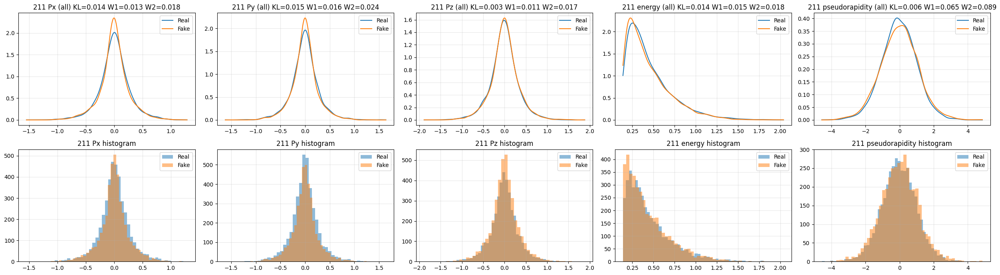

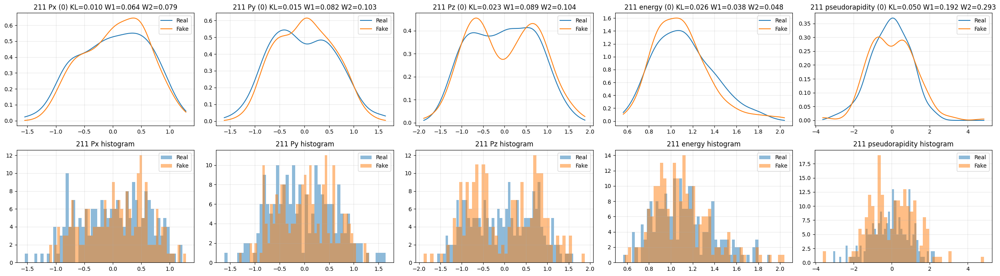

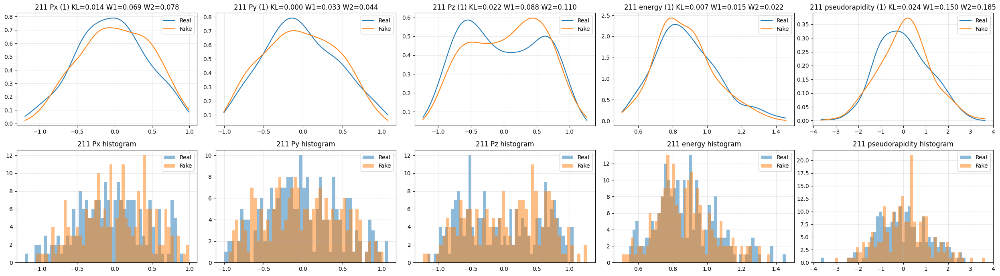

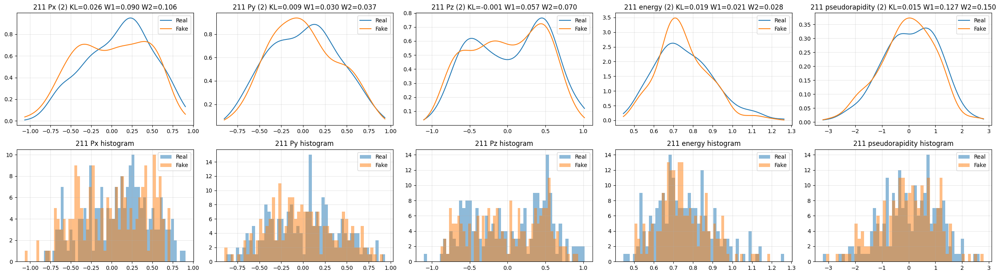

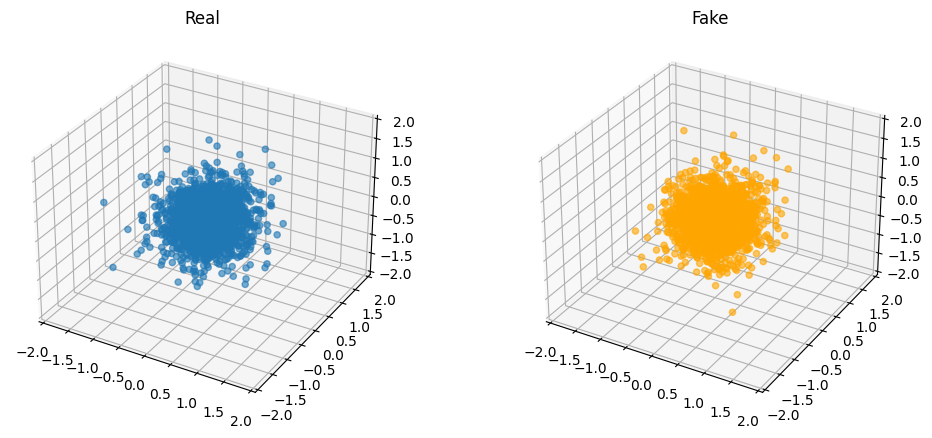

...

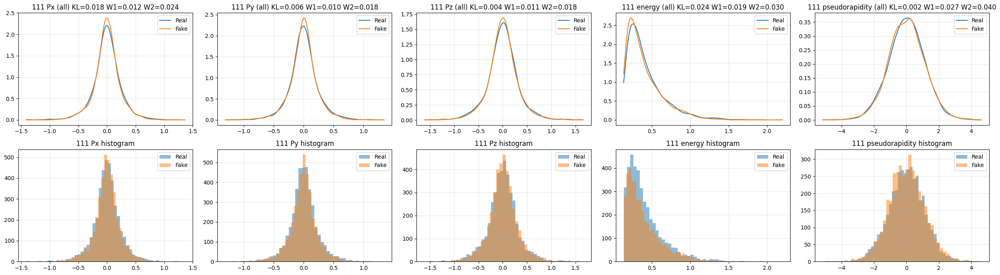

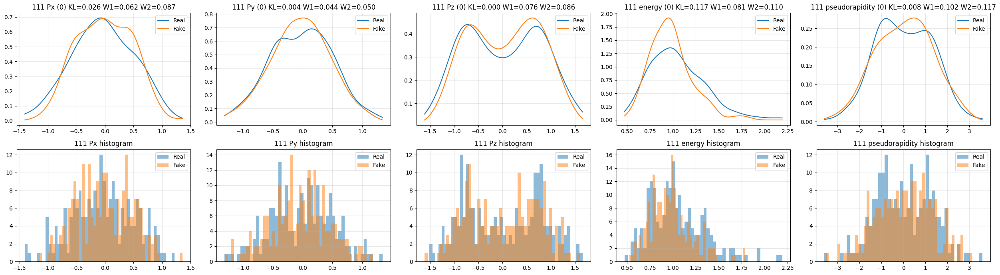

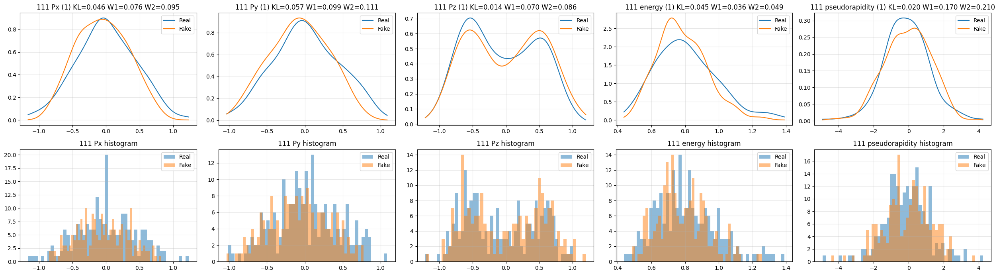

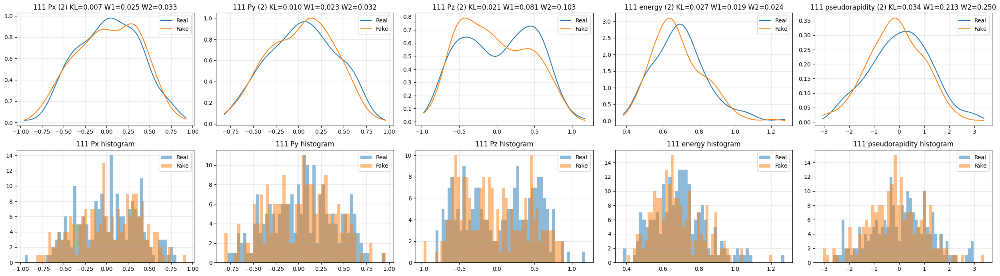

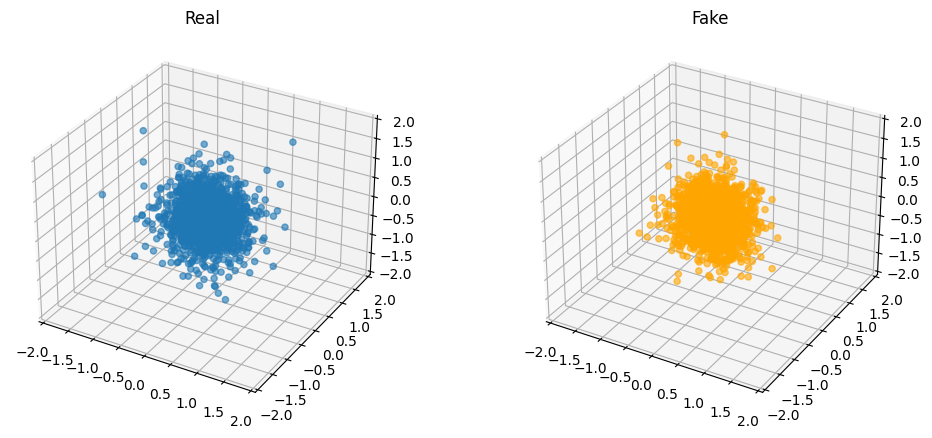

In [ ]:
for n_modes in n_modes_lst:
    G = EPiC_Transformer_Generator(
        latent_global=latent_dim,
        latent_local=latent_local_dim,
        num_labels=num_classes,
        feats=feat_dim,
        max_len=meson_count_max,
        d_model=hid_dim,
        n_heads=n_heads,
        extern_cond_d=extern_cond_d,
        d_ff=hid_dim * 2,
        n_modes=n_modes,
        n_layers=num_layers_gen,
        use_learnable_noise=False,
        #  use_weight_norm=True
    ).to(device)
    D = EPiC_Transformer_Discriminator(
        num_labels=num_classes,
        feats=feat_dim,
        d_model=hid_dim,
        n_heads=n_heads,
        d_ff=hid_dim * 2,
        extern_cond_d=extern_cond_d,
        n_layers=num_layers_disc,
        #  use_weight_norm=True
    ).to(device)

    opt_g = optim.Adam(G.parameters(), lr=lr, betas=betas)
    opt_d = optim.Adam(D.parameters(), lr=lr, betas=betas)

    G, G_shadow, D = train_and_test(
        G=G,
        D=D,
        train_loader=urqmd_train_dataloader,
        optim_G=opt_g,
        optim_D=opt_d,
        device=device,
        mode="lsgan",
        d_iters=d_iters,
        epochs=epochs,
        train_epoch_func=train_epoch_transformer,
        generate_func=generate_transformer,
        test_mom_obj={1.7: test_1_7_mom, 5: test_5_mom},
        test_cond_obj={1.7: test_1_7_cond, 5: test_5_cond},
        test_label_obj={1.7: test_1_7_label, 5: test_5_label},
        test_mask_obj={1.7: test_1_7_mask, 5: test_5_mask},
        test_nucl_mask_obj={1.7: test_1_7_nucl_mask, 5: test_5_nucl_mask},
        test_nucl_obj={1.7: test_1_7_nucl, 5: test_5_nucl},
        test_event_obj={1.7: test_1_7_event, 5: test_5_event},
        metrics_mode_name=f"fixed_{n_modes}_noise",
        final_metrics=METRICS,
        seeds=seeds,
        num_classes=num_classes,
        meson_count_max=meson_count_max,
        use_shadow=True,
        ema_beta=0.999,
        model_name=f"fix_{n_modes}",
    )

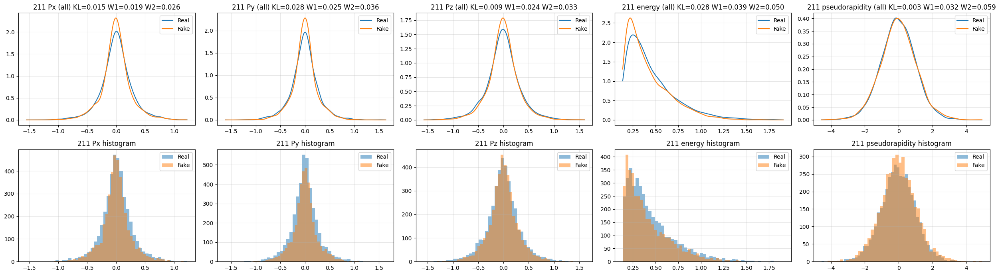

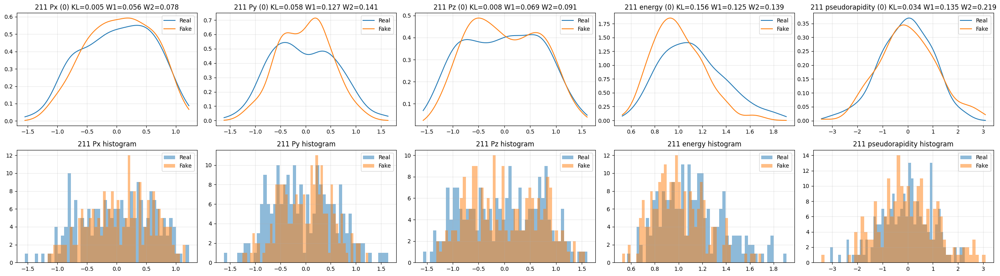

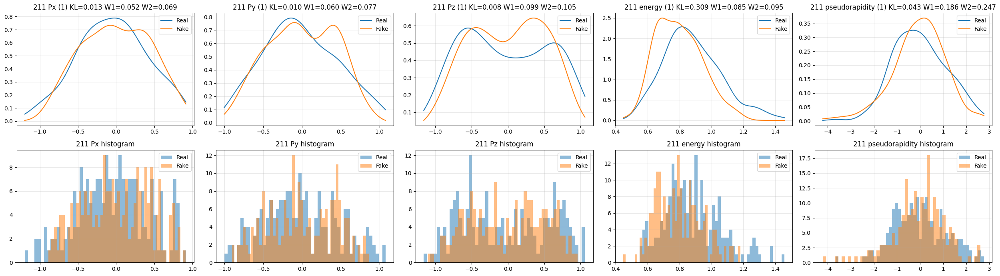

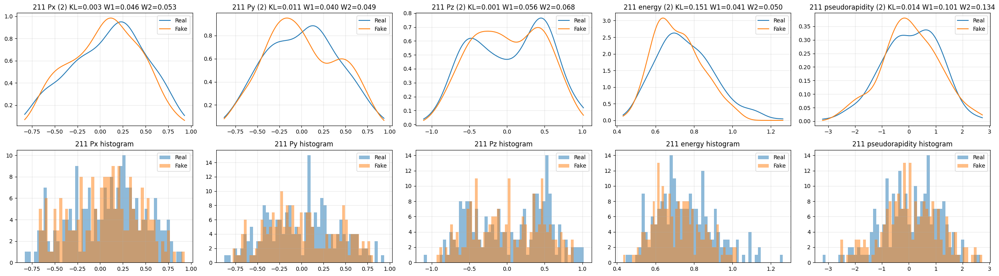

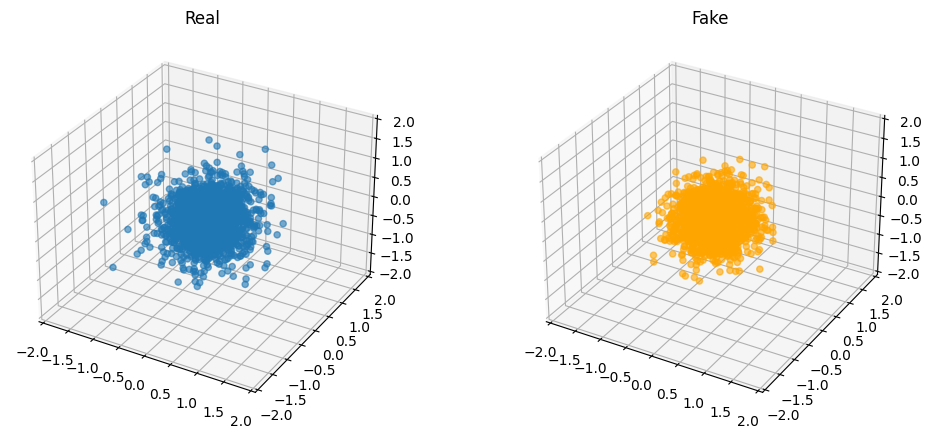

...

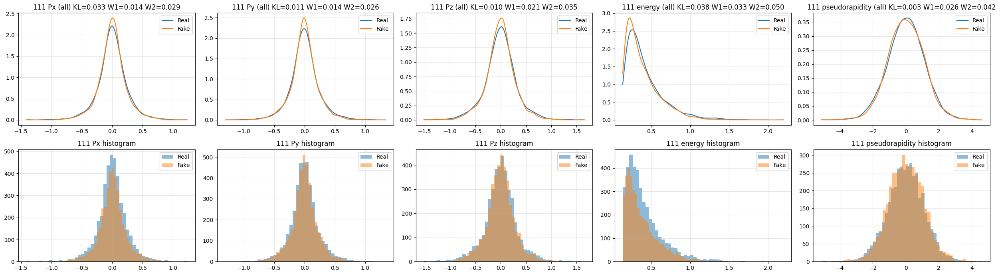

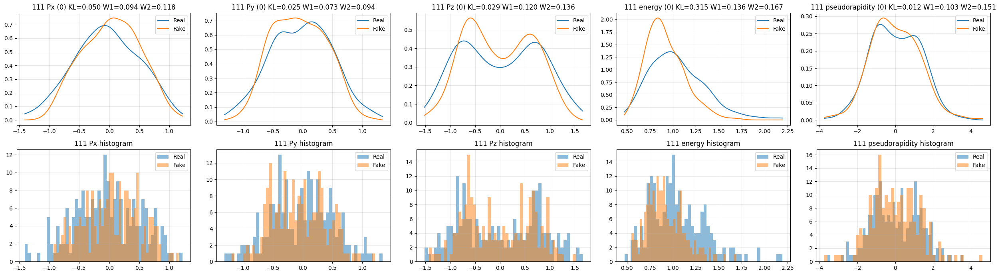

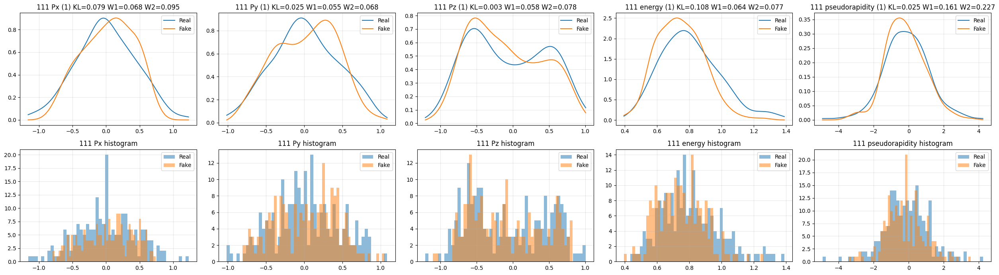

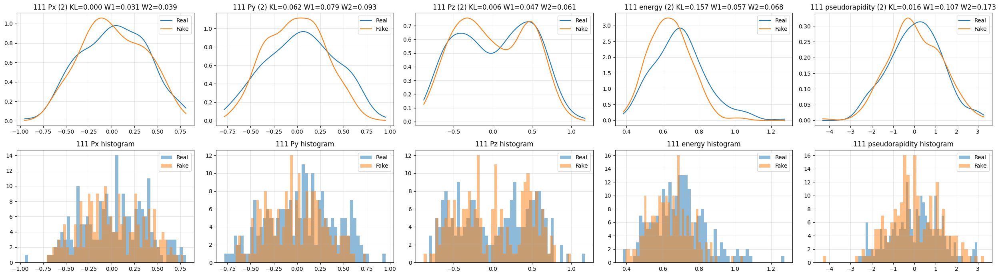

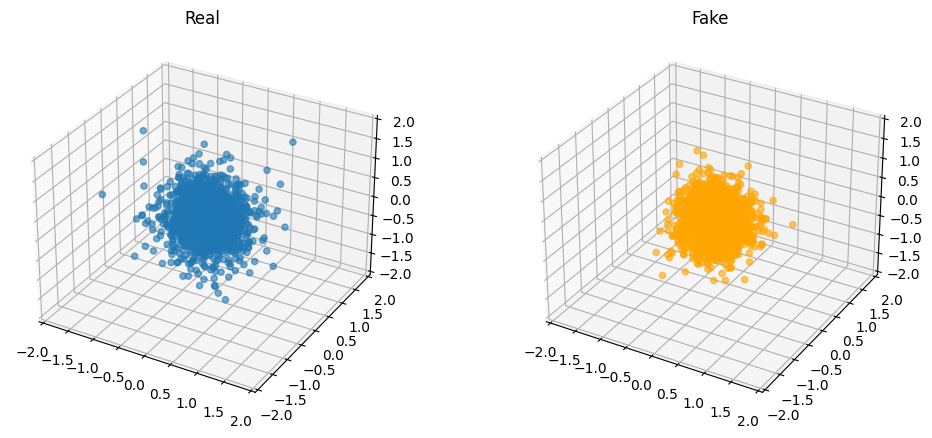

In [ ]:
for n_modes in n_modes_lst:
    G = EPiC_Transformer_Generator(
        latent_global=latent_dim,
        latent_local=latent_local_dim,
        num_labels=num_classes,
        feats=feat_dim,
        max_len=meson_count_max,
        d_model=hid_dim,
        n_heads=n_heads,
        extern_cond_d=extern_cond_d,
        d_ff=hid_dim * 2,
        n_modes=n_modes,
        n_layers=num_layers_gen,
    ).to(device)
    D = EPiC_Transformer_Discriminator(
        num_labels=num_classes,
        feats=feat_dim,
        d_model=hid_dim,
        n_heads=n_heads,
        d_ff=hid_dim * 2,
        extern_cond_d=extern_cond_d,
        n_layers=num_layers_disc,
    ).to(device)

    opt_g = optim.Adam(G.parameters(), lr=lr, betas=betas)
    opt_d = optim.Adam(D.parameters(), lr=lr, betas=betas)

    G, G_shadow, D = train_and_test(
        G=G,
        D=D,
        train_loader=urqmd_train_dataloader,
        optim_G=opt_g,
        optim_D=opt_d,
        device=device,
        mode="lsgan",
        d_iters=d_iters,
        epochs=epochs,
        train_epoch_func=train_epoch_transformer,
        generate_func=generate_transformer,
        test_mom_obj={1.7: test_1_7_mom, 5: test_5_mom},
        test_cond_obj={1.7: test_1_7_cond, 5: test_5_cond},
        test_label_obj={1.7: test_1_7_label, 5: test_5_label},
        test_mask_obj={1.7: test_1_7_mask, 5: test_5_mask},
        test_nucl_mask_obj={1.7: test_1_7_nucl_mask, 5: test_5_nucl_mask},
        test_nucl_obj={1.7: test_1_7_nucl, 5: test_5_nucl},
        test_event_obj={1.7: test_1_7_event, 5: test_5_event},
        metrics_mode_name=f"learnable_{n_modes}_noise",
        final_metrics=METRICS,
        seeds=seeds,
        num_classes=num_classes,
        meson_count_max=meson_count_max,
        use_shadow=True,
        ema_beta=0.999,
        model_name=f"learn_{n_modes}",
    )

## Анализ метрик

Ниже рассчитываем агрегированное по типам частиц и по рандом-сидам значение $W_1$ (среднее, СКО).

In [ ]:
records = []
for noise_type, seeds in METRICS.items():
    for seed, bs in seeds.items():
        for b, pions in bs.items():
            for pion, model_metrics in pions.items():
                for metric, value in model_metrics.items():
                    records.append(
                        {
                            "noise_type": noise_type,
                            "seed": seed,
                            "b": b,
                            "pion": pion,
                            "metric": metric,
                            "value": value,
                        }
                    )
res = (
    pd.DataFrame(records)
    .groupby(["noise_type", "b", "metric"])["value"]
    .agg(["mean", "std"])
    .reset_index()
)
res

,noise_type,b,metric,mean,std
0,fixed_1_noise,1.7,kl,0.005572,0.001532
1,fixed_1_noise,1.7,kl_0,0.010298,0.005432
2,fixed_1_noise,1.7,w1,0.057508,0.018955
3,fixed_1_noise,1.7,w1_0,0.099715,0.022722
4,fixed_1_noise,1.7,w2,0.078746,0.017367
...,...,...,...,...,...
115,learnable_5_noise,5.0,kl_0,0.013786,0.004321
116,learnable_5_noise,5.0,w1,0.024886,0.002428
117,learnable_5_noise,5.0,w1_0,0.140646,0.032722
118,learnable_5_noise,5.0,w2,0.042425,0.001396


In [ ]:
res.to_csv("n_modes_metrics.csv")

Посмотрим модель, которая выдала наилучшую метрику $W_1$ для частицы с максимальным абсолютным значением импульса.

In [22]:
res_subset_1_7 = res[(res["metric"] == "w1_0") & (res["b"] == 1.7)]
res_subset_1_7[res_subset_1_7["mean"] == res_subset_1_7["mean"].min()]

,noise_type,b,metric,mean,std
27,fixed_3_noise,1.7,w1_0,0.079116,0.014567


In [23]:
res_subset_5 = res[(res["metric"] == "w1_0") & (res["b"] == 5)]
res_subset_5[res_subset_5["mean"] == res_subset_5["mean"].min()]

,noise_type,b,metric,mean,std
45,fixed_4_noise,5.0,w1_0,0.117268,0.022927
